# Introduction

In this tutorial, we demonstrate how to use **SpatialZoomer** to identify multi-scale spatial structures in single-cell resolved spatial transcriptomics (ST) data, ranging from cells to niches and tissue domains.  

For illustration, we use a Xenium v1 human lung cancer sample (149195 cells, 377 genes). The tutorial can be completed on a standard personal computer in approximately 20 minutes.

### 0. Load packages and data

Load the ST data, perform quality control on cells and genes, and apply normalization.

In [1]:
import warnings
warnings.filterwarnings("ignore")

# Load packages
import spatialzoomer as sz
import numpy as np
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

# Set figure parameters
plt.rcParams.update({
    "font.family":'sans-serif',
    "mathtext.fontset":'stix',
    "font.size": 7,
    'pdf.fonttype': 42,
    })

Please set the following basic information:
* `runLabel`: The name of dataset.

* `save_path`: A path to save the analysis results.

* `adata`: An **AnnData** object storing single-cell resolved spatial transcriptomics data,  

  - `adata.X` contains the transcriptomic signals.  
  
  - `adata.obsm['spatial']` stores the spatial coordinates.  
 
The **input ST data** in AnnData format can be downloaded from [Google Cloud](https://drive.google.com/file/d/1ITh3qNTEgnyqFh3BLXMvjTQxRsVsZkBC/view?usp=drive_link).

The original data can be downloaded from [Xenium v1 Lung Cancer dataset](https://www.10xgenomics.com/datasets/preview-data-ffpe-human-lung-cancer-with-xenium-multimodal-cell-segmentation-1-standard).  

In [2]:
runLabel = 'Xenium_Lung_Cancer'
save_path = 'E:/SpatialZoomer/Results/' + runLabel+'_SpatialZoomer/'
if not os.path.exists(save_path):
    os.makedirs(save_path)
adata = sc.read_h5ad("E:/SpatialZoomer/Data/" + runLabel+ "_anndata.h5ad")
adata

AnnData object with n_obs × n_vars = 149195 × 377
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs'
    obsm: 'X_nmf', 'spatial'
    varm: 'nmf_loadings'

For brevity, cell and gene quality control steps are omitted here. Please refer to `Tutorial_CosMx_Mouse_Brain_Multi-scale_Analysis.ipynb` or the [Squidpy tutorial](https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_xenium.html).

In [3]:
# Normalization
adata = sz.Preprocess(adata)

### 1. Extract multi-scale features via spectral graph signal processing

- Obtain **graph signals** (cell programs) from transcriptomic data using dimensionality reduction with **NMF**.  

- Construct a **spatial neighbor graph** based on the physical proximity of cells.  

- Apply a bank of **heat kernel–based low-pass filters** to extract features across multiple spatial scales.

Perform NMF to obtain graph signals:

`n_components` specifies the dimensionality of the graph signals.

In [4]:
adata = sz.performDR(adata, type = 'NMF', n_components=50)
adata

Time taken to perform NMF: 20.1080 seconds


AnnData object with n_obs × n_vars = 149195 × 377
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'log1p'
    obsm: 'X_nmf', 'spatial'
    varm: 'nmf_loadings'
    layers: 'counts'

Initialize the SpatialZoomer object and define a set of candidate scales.

In [5]:
sz_analyzer = sz.MultiscaleAnalysis(adata=adata, runLabel=runLabel, save_path=save_path)
 
scales = [0.01] \
    + np.arange(0.1, 2.1, 0.1).tolist() \
    + np.arange(2.5, 15.5, 0.5).tolist() \
    + np.arange(16, 21, 1).tolist() \
    +  np.arange(25, 55, 5).tolist()
scales = [round(x, 2) for x in scales]

Perform spectral graph signal processing to extract multi-scale features:

- `use_rep`: selects graph signals from adata.obsm; here we use "X_nmf" (NMF-transformed data)

- `n_neighbors`: number of neighbors in the spatial neighbor graph (recommended: 10–20)

- `scales`: custom-defined above; if not provided, scales are automatically generated as above

In [6]:
sz_analyzer.multiscale_transform(use_rep='X_nmf', n_neighbors=20, scales=scales)

Median similarities:  4.999999999972449
Time taken to construct spatial_knn: 0.5328 seconds
Time taken to perform spectral graph filter bank: 51.9072 seconds
Transformed signals saved to E:/SpatialZoomer/Results/Xenium_Lung_Cancer_SpatialZoomer//Xenium_Lung_Cancer_transformed_signals.h5


### 2. Identify critical scales automatically

SpatialZoomer employs a dynamic programming strategy that partitions the cross-scale similarity map, which is constructed from transformed signals across ranked candidate scales, into contiguous diagonal blocks. The optimal number of blocks is determined automatically. From each block, the start and center points are selected as critical scales, representing “tipping” and “representative” points, respectively. 

- `max_clusters` and `min_clusters` specify the range of possible block numbers.  
  Within this range, the Elbow method is applied to automatically determine the optimal number of blocks.

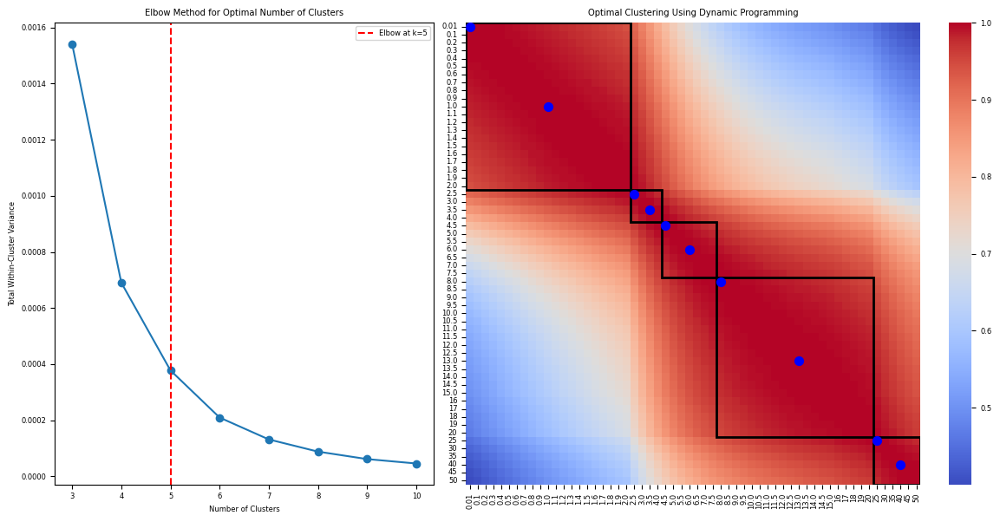

The optimal number of clusters is: 5
Typical scales: [0.01, 1.0, 2.5, 3.5, 4.5, 6.0, 8.0, 13.0, 25, 40]
Time taken to perform identification of typical scales: 5.9799 seconds


In [7]:
sz_analyzer.identify_typical_scales(max_clusters=10, min_clusters=3)

### 3. Identify spatial structures using two-step clustering

Clustering is performed in two steps:  

1. **Mini-Batch K-Means** is applied to the transformed signals at a given scale to obtain an initial coarse clustering, yielding 10,000 metacells.  

2. **Leiden algorithm** is then applied to the metacells to obtain fine-grained clusters. A higher clustering resolution yields more clusters.  

**Recommendation:** test **multiple resolution values** (e.g., 0.2, 0.4, 0.8, 1.0) and select the setting that matches biological expectations and downstream tasks.


In [8]:
resolutions = [0.8, 1]
sz_analyzer.clustering(n_clusters_kmeans=10000, resolutions=resolutions)

Time taken to perform UMAP and clustering for raw signal: 112.7430 seconds
Time taken to perform clustering for signal at scale 0.01: 54.8697 seconds
Time taken to perform clustering for signal at scale 1.0: 59.0674 seconds
Time taken to perform clustering for signal at scale 2.5: 55.7906 seconds
Time taken to perform clustering for signal at scale 3.5: 53.9968 seconds
Time taken to perform clustering for signal at scale 4.5: 51.2506 seconds
Time taken to perform clustering for signal at scale 6.0: 49.9106 seconds
Time taken to perform clustering for signal at scale 8.0: 49.8473 seconds
Time taken to perform clustering for signal at scale 13.0: 52.8674 seconds
Time taken to perform clustering for signal at scale 25.0: 52.0585 seconds
Time taken to perform clustering for signal at scale 40.0: 58.1844 seconds
Total time: 537.9065 seconds


The clustering and UMAP results at each critical scale are stored in `sz_analyzer.adata`.

- **Clustering results** are stored in `sz_analyzer.adata.obs`, with keys formatted as `leiden_<scale>_res<resolution>`. 
  
  For example, "leiden_Raw_res0.8", "leiden_Raw_res1", "leiden_scale1.0_res0.8", and "leiden_scale1.0_res1".  


- **UMAP embeddings** are stored in `sz_analyzer.adata.obsm`, with keys formatted as `X_umap_<scale>`. 

  For example, "X_umap_Raw" and "X_umap_scale1.0".


In [9]:
sz_analyzer.adata

AnnData object with n_obs × n_vars = 149195 × 377
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'Kmeans_Raw', 'leiden_Raw_res0.8', 'leiden_Raw_res1', 'Kmeans_scale0.01', 'leiden_scale0.01_res0.8', 'leiden_scale0.01_res1', 'Kmeans_scale1.0', 'leiden_scale1.0_res0.8', 'leiden_scale1.0_res1', 'Kmeans_scale2.5', 'leiden_scale2.5_res0.8', 'leiden_scale2.5_res1', 'Kmeans_scale3.5', 'leiden_scale3.5_res0.8', 'leiden_scale3.5_res1', 'Kmeans_scale4.5', 'leiden_scale4.5_res0.8', 'leiden_scale4.5_res1', 'Kmeans_scale6.0', 'leiden_scale6.0_res0.8', 'leiden_scale6.0_res1', 'Kmeans_scale8.0', 'leiden

### Results and Analysis

- In the **raw signal space** (Scale 0.0), clustering reflects the single-cell scale, enabling the identification of cell types or states.  

- **As the scale increases**, each cell progressively integrates spatial context from broader neighborhoods, resulting in smoother signals that capture more global spatial structures such as niches and domains.  

- **At excessively large scales** (e.g. scale 25.0 and 40.0), all cells become increasingly similar, and the signals are over-smoothed. In this regime, spatial smoothing overwhelms the omics heterogeneity, leading to block-like clusters on the spatial slide and spherical patterns in UMAP space that lack meaningful biological distinctions.

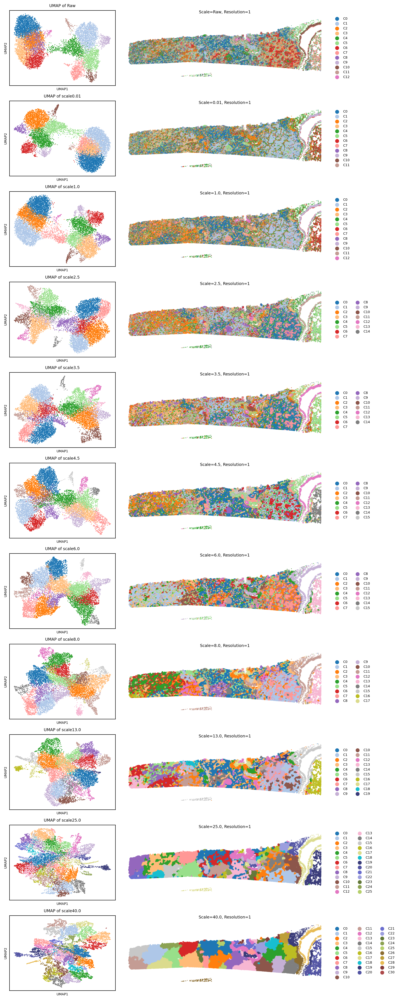

In [10]:
sz_analyzer.plot_multiscale_clusters(resolution=1, figsize=(10, 25))

Quantify the contributions of spatial proximity and transcriptomic similarity to clustering outcomes across different scales.

Median similarities:  1000.7855939439206
Time taken to construct expr_knn: 12.0406 seconds


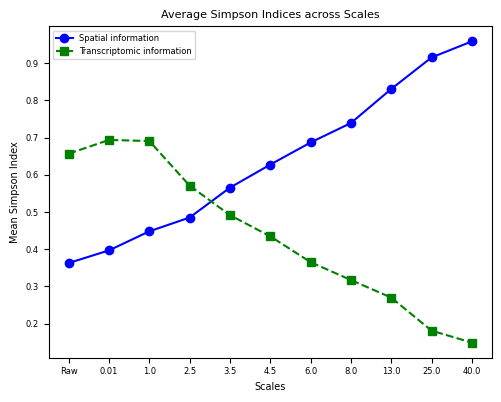

In [11]:
sz_analyzer.plot_simpson()

The `sz_analyzer.adata` object is an AnnData instance that is compatible with the Python ecosystem for scRNA-seq and ST data, including packages such as **scanpy** and **squidpy**. Users can therefore directly leverage these packages for further downstream analysis and visualization.

In [12]:
sz_analyzer.adata.write(save_path + runLabel + '_SpatialZoomer.h5ad')

### Results in `save_path` folder

The following output files are generated and saved in the `save_path` directory:

- `<runLabel>_transformed_signals.h5`: Stores the multi-scale features extracted by the spectral graph filter bank.  

  Dimensions: *cells × cell programs × candidate scales*.  

- `Typical_scales.pdf`: Visualization of critical scale selection, generated by `identify_typical_scales()`.  

- `Typical_scales.csv`: Data frame recording the selected critical scales.  

- `<runLabel>_object_kmeans_<critical scale>.h5ad`: A series of AnnData objects storing the K-Means clustering results of metacells at specific critical scales.

  These intermediate results can be further refined by applying the Leiden algorithm, where adjusting the clustering resolution allows generation of the final clustering results.

- `Average_Simpson_Indices_across_Scales.pdf`: Output of `plot_simpson()`, which quantifies the contributions of spatial proximity and transcriptomic similarity to clustering results across scales.  

- `<runLabel>_SpatialZoomer.h5ad`: The core AnnData object containing all multi-scale clustering results, recommended for downstream analyses.